<a href="https://colab.research.google.com/github/YelizavetaP/Diploma/blob/main/compare_sml_30_50_pretrained.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import os
import glob as glob
import cv2
import requests
import random
import numpy as np
import matplotlib.pyplot as plt
import zipfile


SEED = 42
np.random.seed(SEED)

In [2]:
!ls

sample_data


In [44]:
TRAIN = True
EPOCHS = 50

In [7]:
if not os.path.exists('train'):
  # !curl -L "https://public.roboflow.com/ds/eeEn0ooyVp?key=oVU0nHEbsv" > WildfireSmoke.v1-raw.yolov5-obb.zip; unzip WildfireSmoke.v1-raw.yolov5-obb.zip; rm WildfireSmoke.v1-raw.yolov5-obb.zip;
  # !curl -L "https://universe.roboflow.com/ds/9jTShslU2P?key=wfDTAKpSzw" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
  # !curl 

  with zipfile.ZipFile('Fire and Smoke Training.v1-fire-and-smoke-data-7-11-2022.yolov5pytorch.zip', 'r') as zip_ref:
      zip_ref.extractall()
  dirs = ['train', 'valid', 'test']

  for i, dir_name in enumerate(dirs):
    all_image_names = sorted(os.listdir(f"{dir_name}/images"))
    for j, image_name in enumerate(all_image_names):
      if (j % 2) == 0:
        file_name = image_name.split('.jpg')[0]
        os.remove(f"{dir_name}/images/{image_name}")
        os.remove(f"{dir_name}/labels/{file_name}.txt")


In [8]:
class_names = ['fire', 'smoke']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))
colors

array([[ 95.50773031, 242.43214813, 186.65845516],
       [152.65791347,  39.78475331,  39.77860269]])

In [9]:
# yolo bb to coords
def yolo2bbox(bb):
  xmin, ymin = bb[0] - bb[2]/2, bb[1] - bb[3]/2
  xmax, ymax = bb[0] + bb[2]/2, bb[1] + bb[3]/2
  return xmin, ymin, xmax, ymax

In [10]:
def plot_box(image, bboxes, labels):
  h, w = image.shape #image h and w to demorm bb coords

  for box_num, box in enumerate(bboxes):
    x1, y1, x2, y2 = yolo2bbox(box)

    # denorm
    xmin = int(x1*w)
    ymin = int(y1*h)
    xmax = int(x2*w)
    ymax = int(y2*h)
    width, heigth = xmax - xmin, ymax - ymin

    class_name = class_names[int(labels[box_num])] #get class name

    # draw rectangle
    cv2.rectangle(
        image,
        (xmin, ymin), (xmax, ymax),
        color = colors[class_names.index(class_name)],
        thickness = 2
    )

    # draw text
    # font_scale = min(1, max(3,int(w/50)))
    # font_thickness = min(2, max(10,int(w/50)))

    # p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
    # # text w and h
    # tw, th = cv2.getTextSize(
    #     class_name,
    #     color = class_names[int(labels[box_num])],
    #     thickness = -1,
    # )[0]

    # p2 = p1[0] + tw, p1[1] + -th -10

    # cv2.rectangle(
    #     image,
    #     p1, p2,
    #     color = colors[class_names.index(class_name)],
    #     thickness = -1
    # )

    # cv2.putText(
    #     image, class_name,
    #     (xmin+1, ymin - 10),
    #     cv2.FOMT_HERSHEY_SIMPLEX,
    #     font_scale,
    #     (255, 255, 255),
    #     font_thickness
    # )


In [11]:
def plot(image_paths, label_paths, num_samples):
  all_training_images = glob.glob(image_paths)
  all_training_labels = glob.glob(label_paths)
  all_training_images.sort()
  all_training_labels.sort()

  num_images = len(all_training_images)

  plt.figure(figsize=(15, 12))

  for i in range(num_samples):
    j = random.randint(0,num_images-1)
    image = cv2.imread(all_training_images[j])
    with open(all_training_labels[j], 'r') as f:
      bboxes = []
      labels = []
      label_lines = f.readlines()
      for label_line in label_lines:
        label = label_line[0]
        bbox_string = label_line[2:]
        x_c, y_c, w, h = bbox_string.split(' ')
        x_c = float(x_c)
        y_c = float(y_c)
        w = float(w)
        h = float(h)
        bboxes.append([x_c, y_c, w, h])
        labels.append(label)
    result_image = plot_box(image, bboxes, labels)
    plt.subplot(2, 2, i+1)
    plt.imshow(result_image[:, :, ::-1])
    plt.axis('off')
  plt.subplots_adjust(wspace=0)
  plt.tight_layout()
  plt.show()

log results

In [12]:
def set_res_dir():
  # dir to dtore res
  res_dir_count = len(glob.glob('runs/train/*'))
  print(f"Current number of result directories: {res_dir_count}")
  if TRAIN:
    RES_DIR = f"results_{res_dir_count+1}"
    print(RES_DIR)
  else:
    RES_DIR = f"results_{res_dir_count}"
  return RES_DIR

In [13]:
def monitor_tensorboard():
  %load_ext tensorboard
  %tensorboard --logdir runs/train

#Clone YOLO

In [14]:
if not os.path.exists('yolov5'):
  !git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 14302, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 14302 (delta 26), reused 25 (delta 8), pack-reused 14242
Receiving objects: 100% (14302/14302), 13.59 MiB | 21.88 MiB/s, done.
Resolving deltas: 100% (9833/9833), done.


In [15]:
%cd yolov5/
!pwd

/content/yolov5
/content/yolov5


In [16]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 15.4 MB/s 
     |████████████████████████████████| 62 kB 1.1 MB/s 
     |████████████████████████████████| 1.6 MB 27.8 MB/s 


#Train YOLO

In [47]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [46]:
RES_DIR = set_res_dir()
if TRAIN:
  !python train.py --data ../data.yaml --weights yolov5l.pt  --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

Current number of result directories: 9
results_10
train: weights=yolov5l.pt, cfg=, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_10, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, ancho

In [28]:
 !zip -r lesult_30_64_pretrained.zip runs/train/results_4

  adding: runs/train/results_4/ (stored 0%)
  adding: runs/train/results_4/weights/ (stored 0%)
  adding: runs/train/results_4/weights/best.pt (deflated 9%)
  adding: runs/train/results_4/weights/last.pt (deflated 9%)
  adding: runs/train/results_4/train_batch0.jpg (deflated 7%)
  adding: runs/train/results_4/val_batch0_pred.jpg (deflated 10%)
  adding: runs/train/results_4/val_batch1_pred.jpg (deflated 11%)
  adding: runs/train/results_4/results.csv (deflated 82%)
  adding: runs/train/results_4/P_curve.png (deflated 10%)
  adding: runs/train/results_4/val_batch2_labels.jpg (deflated 28%)
  adding: runs/train/results_4/train_batch1.jpg (deflated 5%)
  adding: runs/train/results_4/events.out.tfevents.1670156341.782c2d36b647.688.0 (deflated 33%)
  adding: runs/train/results_4/opt.yaml (deflated 50%)
  adding: runs/train/results_4/val_batch1_labels.jpg (deflated 11%)
  adding: runs/train/results_4/PR_curve.png (deflated 11%)
  adding: runs/train/results_4/val_batch2_pred.jpg (deflated 29%

In [33]:
def show_valid_results(RES_DIR):
  !ls runs/train/{RES_DIR}
  EXP_PATH = f"runs/train/{RES_DIR}"
  validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
  print(validation_pred_images)
  for pred_image in validation_pred_images:
      image = cv2.imread(pred_image)
      plt.figure(figsize=(19, 16))
      plt.imshow(image[:, :, ::-1])
      plt.axis('off')
      plt.show()


In [34]:
def inference(RES_DIR, data_path):
  # Directory to store inference results.\n",
  infer_dir_count = len(glob.glob('runs/detect/*'))
  print(f"Current number of inference detection directories: {infer_dir_count}")
  INFER_DIR = f"inference_{infer_dir_count+1}"
  print(INFER_DIR)
  # Inference on images.\n",
  !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
  --source {data_path} --name {INFER_DIR}
  return INFER_DIR

In [25]:
rnd_array = np.random.randint(0, 50, size=10)

In [35]:
def visualize(INFER_DIR):
  INFER_PATH = f"runs/detect/{INFER_DIR}"
  infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
  for i,pred_image in enumerate(infer_images):
    if i == 10:
      break
    image = cv2.imread(infer_images[rnd_array[i]])
    plt.figure(figsize=(12,9))
    plt.imshow(image[:,:,::-1])
    plt.axis('off')
    plt.show()

confusion_matrix.png				    results.png
events.out.tfevents.1670160690.782c2d36b647.1424.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights
['runs/train/results_8/val_batch0_pred.jpg', 'runs/train/results_8/val_batch1_pred.jpg', 'runs/train/results_8/val_batch2_pred.jpg']


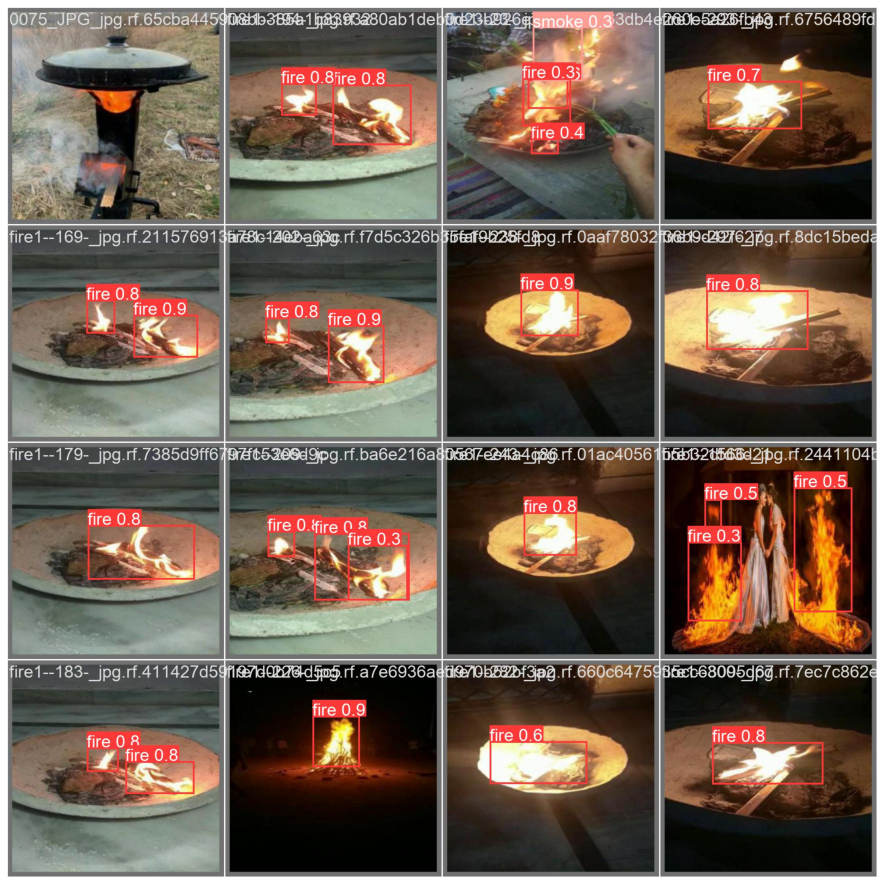

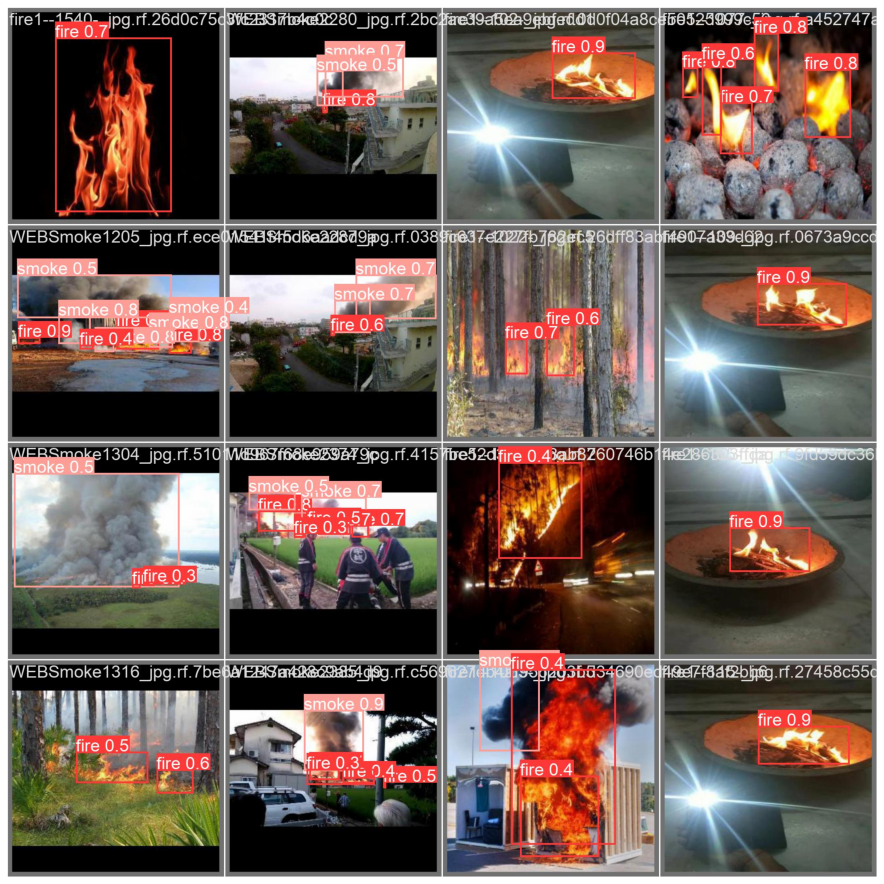

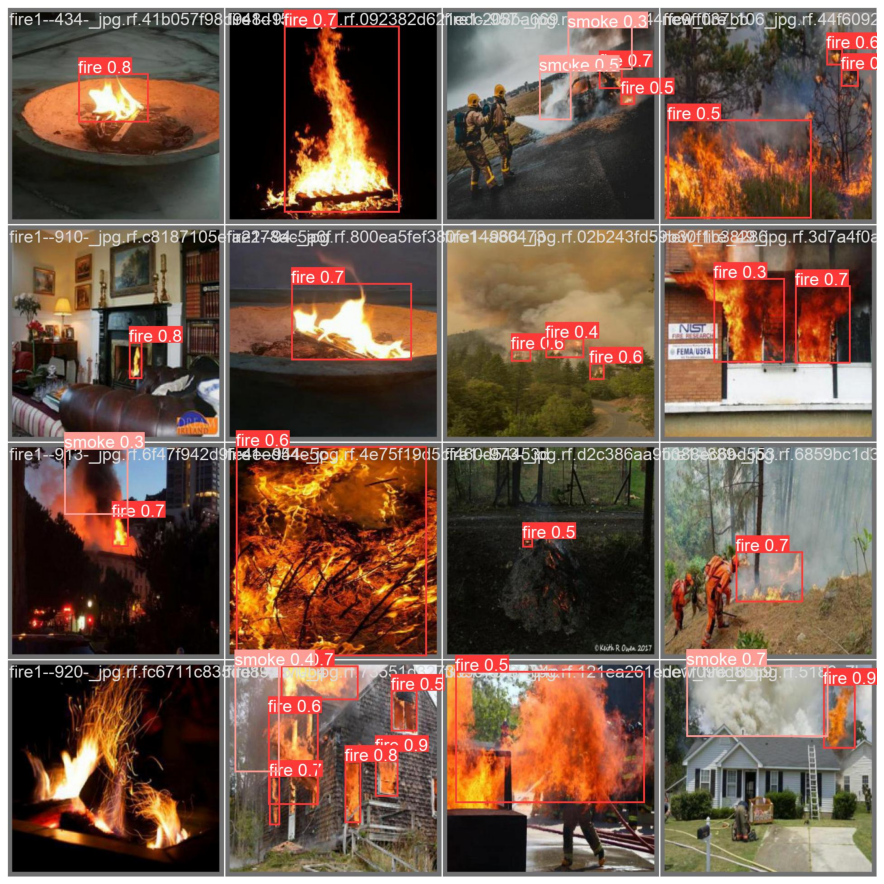

In [36]:
show_valid_results(RES_DIR)

In [37]:
IMAGE_INFER_DIR = inference(RES_DIR, '../test/images')

Current number of inference detection directories: 0
inference_1
detect: weights=['runs/train/results_8/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=inference_1, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46113663 parameters, 0 gradients, 107.7 GFLOPs
image 1/129 /content/test/images/0082_jpg.rf.66c5634e1b18f3316fe7b0ce3e8f6586.jpg: 640x640 1 fire, 52.7ms
image 2/129 /content/test/images/0104_jpg.rf.fd136f09d463cadac42a2f71b31a0edd.jpg: 640x640 1 fire, 39.4ms
image 3/129 /content/test/images/0116_JPG_jpg.rf.51001e61

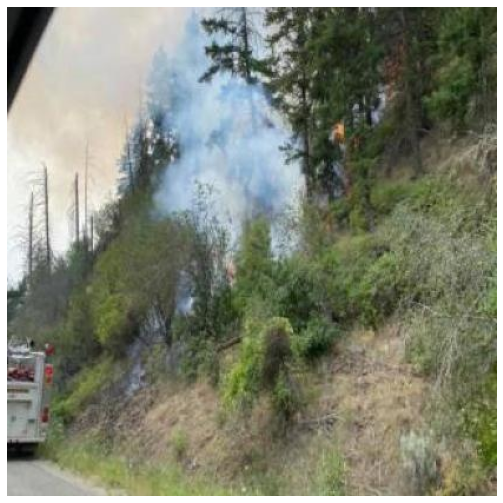

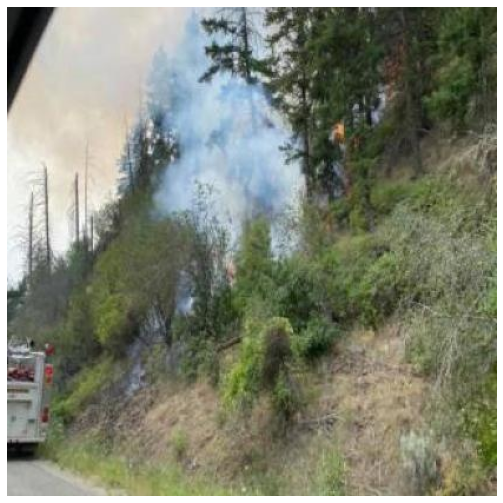

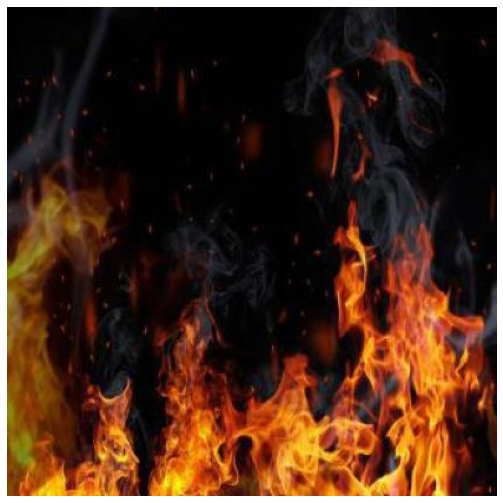

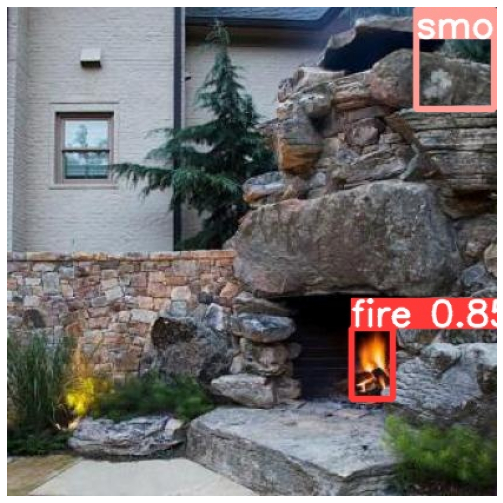

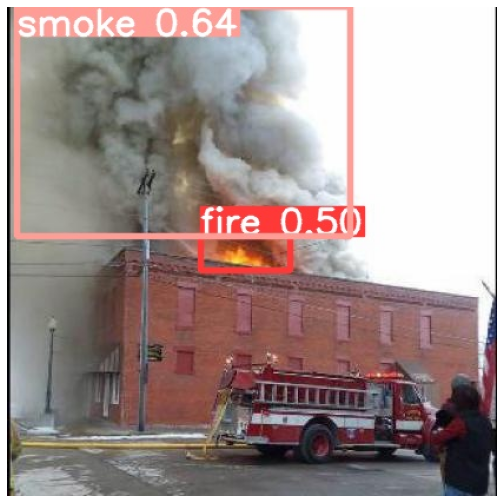

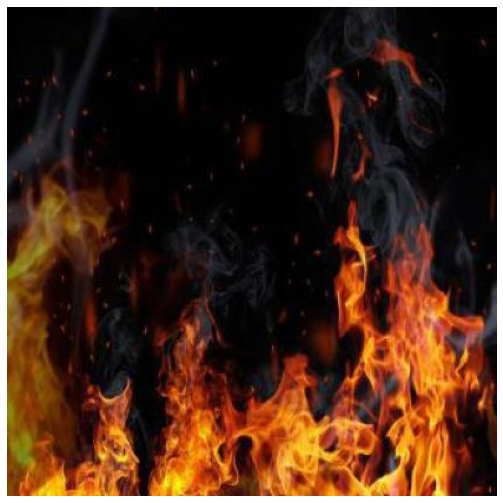

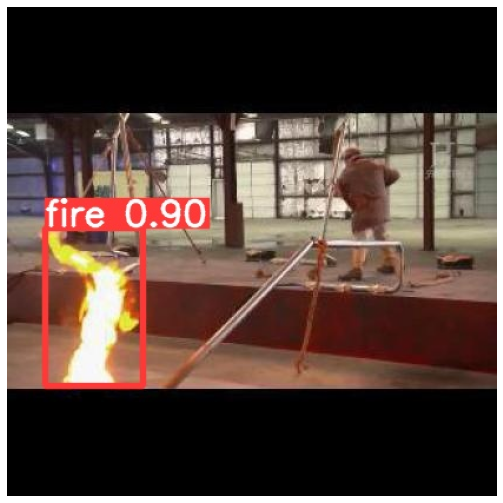

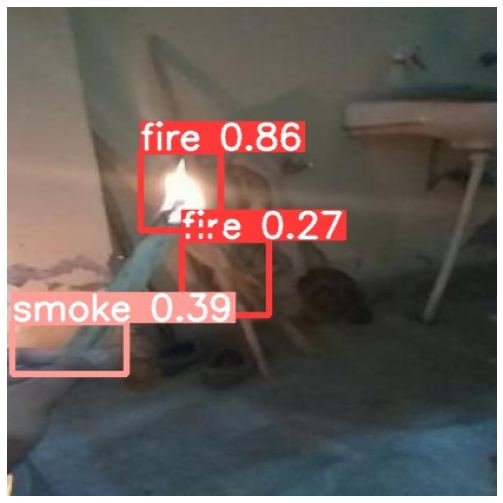

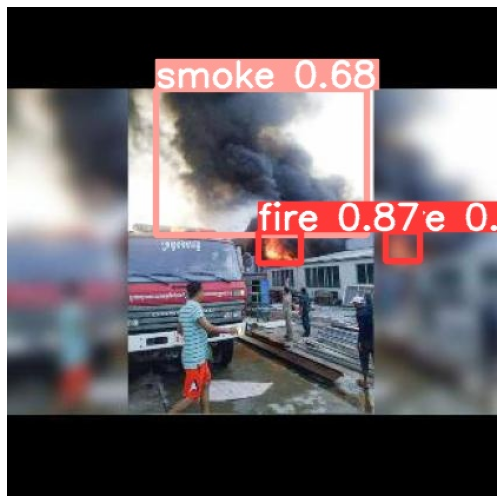

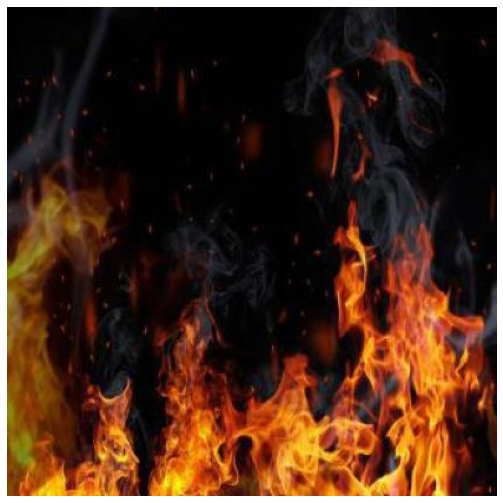

In [38]:
visualize(IMAGE_INFER_DIR)

In [43]:
!python detect.py --weights runs/train/results_8/weights/best.pt \
  --source ../15xp-mosquitofire-02-facebookJumbo.jpg --name images_test

detect: weights=['runs/train/results_8/weights/best.pt'], source=../15xp-mosquitofire-02-facebookJumbo.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=images_test, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-23-g5dc1ce4 Python-3.8.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46113663 parameters, 0 gradients, 107.7 GFLOPs
image 1/1 /content/15xp-mosquitofire-02-facebookJumbo.jpg: 352x640 5 fires, 1 smoke, 34.7ms
Speed: 0.4ms pre-process, 34.7ms inference, 1.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/images_test5
